In [1]:
from IPython.display import display, HTML

display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 65%; }
    div#maintoolbar-container { width: 99%; }
</style>
"""))
display(HTML("<style>div.output_scroll { height: 200em; }</style>"))

In [2]:
import sys
sys.path.append("/users/hgarsden/.local/lib/python3.9/site-packages")

In [3]:
%matplotlib inline
#%load_ext line_profiler
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import glob
import hera_cal as hc
import hera_pspec as hp
from hera_pspec.data import DATA_PATH
from pyuvdata import UVData, UVCal, UVFlag, utils as uvutils
from scipy import stats, signal, interpolate
import copy
import matplotlib.gridspec as gridspec
from astropy import constants
import uvtools as uvt
import cycler
import itertools
import os
from collections import OrderedDict as odict

In [10]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [11]:
import matplotlib.ticker as ticker

In [12]:
def fmt(x, pos):
    a, b = '{:.2e}'.format(x).split('e')
    b = int(b)
    return r'${} \times 10^{{{}}}$'.format(a, b)

In [13]:
import matplotlib.font_manager

## Null tests on pure-noise simulations

In [8]:
from hera_pspec.data import DATA_PATH
cosmo = hp.conversions.Cosmo_Conversions()
beamfile = os.path.join(DATA_PATH, 'HERA_NF_dipole_power.beamfits')
uvb = hp.pspecbeam.PSpecBeamUV(beamfile, cosmo=cosmo)

#### simulate data

In [9]:
bls1, bls2, blpairs= [(23, 37)], [(36, 51)], [((23, 37), (36, 51))]

In [10]:
hd = hc.io.HERAData('/lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/clean.uvh5')
data, flags, nsamples = hd.read(freq_chans=np.arange(550, 650))

LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/clean.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.


In [11]:
spws = (0, 99)

In [12]:
Jy_to_mK = uvb.Jy_to_mK(hd.freq_array[0], pol='xx')

In [13]:
known_cov = {}
model = 'noise'
Ntimes = 21
Nfreqs = 100

for blpair in blpairs:
    dset1, bl1 = 0, (blpair[0][0],blpair[0][1],'xx')
    dset2, bl2 = 1, (blpair[1][0],blpair[1][1],'xx')
    
    bl= (blpair[0][0], blpair[0][1], 'ee')
    dt = nsamples[bl] * hd.integration_time[0]
    df = hd.channel_width
    nvar1 = hc.redcal.predict_noise_variance_from_autos(bl, data, dt=dt, df=df)
    nvar1[np.isnan(nvar1)] = 0.0 
    nvar1 *= Jy_to_mK**2
    
    bl= (blpair[1][0], blpair[1][1], 'ee')
    dt = nsamples[bl] * hd.integration_time[0]
    df = hd.channel_width
    nvar2 = hc.redcal.predict_noise_variance_from_autos(bl, data, dt=dt, df=df)
    nvar2[np.isnan(nvar2)] = 0.0 
    nvar2 *= Jy_to_mK**2
    
    for time_index in range(Ntimes):
        C_n_11 = np.diag(nvar1[600+time_index,:Nfreqs])
        C_n_22 = np.diag(nvar2[600+time_index,:Nfreqs])
           
        Ckey = ((dset1, dset1), (bl1,bl1), ) + (model, time_index, False, True,)
        known_cov[Ckey] = C_n_11
        Ckey = ((dset1, dset1), (bl1,bl1), ) + (model, time_index, False, False,)
        known_cov[Ckey] = np.zeros_like(C_n_11)
        Ckey = ((dset1, dset1), (bl1,bl1), ) + (model, time_index, True, True,)
        known_cov[Ckey] = np.zeros_like(C_n_11)

        Ckey = ((dset2, dset2), (bl2,bl2), ) + (model, time_index, False, True,)
        known_cov[Ckey] = C_n_22
        Ckey = ((dset2, dset2), (bl2,bl2), ) + (model, time_index, False, False,)
        known_cov[Ckey] = np.zeros_like(C_n_11)
        Ckey = ((dset2, dset2), (bl2,bl2), ) + (model, time_index, True, True,)
        known_cov[Ckey] = np.zeros_like(C_n_11)

        Ckey = ((dset1, dset2), (bl1,bl2), ) + (model, time_index, False, True,)
        known_cov[Ckey] = np.zeros_like(C_n_11)
        Ckey = ((dset2, dset1), (bl2,bl1), ) + (model, time_index, False, True,)
        known_cov[Ckey] = np.zeros_like(C_n_11)
        Ckey = ((dset2, dset1), (bl2,bl1), ) + (model, time_index, False, False,)
        known_cov[Ckey] = np.zeros_like(C_n_11)
        Ckey = ((dset2, dset1), (bl2,bl1), ) + (model, time_index, True, True,)
        known_cov[Ckey] = np.zeros_like(C_n_11)

divide by zero encountered in true_divide
invalid value encountered in true_divide


#### Load data and generate power spectrum

There are already noise realizations from the input covariance specified above. 

In [14]:
#uvp_td_11s, uvp_td_12s, uvps = [], [], []
uvps = []
for i, df in enumerate(sorted(glob.glob("/lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_*.uvh5"))):
    print(i, df)
    uvn_ = UVData()
    uvn_.read_uvh5(df)
    uvn = uvn_.select(time_range=[2458116.3192, 2458116.3244], inplace=False)
    uvn.data_array *= Jy_to_mK[None, None, :, None]
    ds = hp.PSpecData(dsets=[uvn, uvn], wgts=[None, None], beam=uvb)
    # change units of UVData objects
    ds.dsets[0].vis_units = 'mK'
    ds.dsets[1].vis_units = 'mK'
    #uvn_1 = uvn.select(times=np.unique(uvn.time_array)[0:-1:1],inplace=False)
    #uvn_2 = uvn.select(times=np.unique(uvn.time_array)[1::1],inplace=False)
    #uvn_td = copy.deepcopy(uvn_1)
    #uvn_td.data_array = (uvn_1.data_array - uvn_2.data_array)/np.sqrt(2)
    #ds_td = hp.PSpecData(dsets=[uvn_td, uvn_td], wgts=[None, None], beam=uvb)
    
    #uvp_td_11, uvp_td_q_11 = ds_td.pspec( bls1, bls1, (0, 1), [(-5, -5)], spw_ranges=spws, input_data_weight='identity', 
    #                                    norm='I', taper='blackman-harris', store_cov = False, verbose=False)
    #uvp_td_12, uvp_td_q_12 = ds_td.pspec( bls1, bls2, (0, 1), [(-5, -5)], spw_ranges=spws, input_data_weight='identity', 
    #                                                                           norm='I', taper='blackman-harris', store_cov = False, verbose=False)
    uvp = ds.pspec( bls1, bls2, (0, 1), [(-5, -5)], spw_ranges=spws, input_data_weight='identity', 
                      norm='I', taper='blackman-harris', store_cov = True, cov_model='noise', known_cov=known_cov, verbose=False)
    uvp.write_hdf5("noise_{}_uvpspec3".format(i), overwrite=True)
    #uvp_td_11s.append(uvp_td_11)
    #uvp_td_12s.append(uvp_td_12)
    uvps.append(uvp)

0 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_00.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_00.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_0_uvpspec3 exists, overwriting...
1 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_01.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_01.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_1_uvpspec3 exists, overwriting...
2 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_02.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_02.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_2_uvpspec3 exists, overwriting...
3 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_03.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_03.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_3_uvpspec3 exists, overwriting...
4 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_04.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_04.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_4_uvpspec3 exists, overwriting...
5 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_05.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_05.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_5_uvpspec3 exists, overwriting...
6 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_06.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_06.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_6_uvpspec3 exists, overwriting...
7 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_07.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_07.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_7_uvpspec3 exists, overwriting...
8 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_08.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_08.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_8_uvpspec3 exists, overwriting...
9 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_09.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_09.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_9_uvpspec3 exists, overwriting...
10 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_10.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_10.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_10_uvpspec3 exists, overwriting...
11 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_11.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_11.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_11_uvpspec3 exists, overwriting...
12 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_12.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_12.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_12_uvpspec3 exists, overwriting...
13 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_13.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_13.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_13_uvpspec3 exists, overwriting...
14 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_14.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_14.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_14_uvpspec3 exists, overwriting...
15 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_15.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_15.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_15_uvpspec3 exists, overwriting...
16 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_16.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_16.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_16_uvpspec3 exists, overwriting...
17 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_17.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_17.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_17_uvpspec3 exists, overwriting...
18 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_18.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_18.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_18_uvpspec3 exists, overwriting...
19 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_19.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_19.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_19_uvpspec3 exists, overwriting...
20 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_20.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_20.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_20_uvpspec3 exists, overwriting...
21 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_21.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_21.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_21_uvpspec3 exists, overwriting...
22 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_22.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_22.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_22_uvpspec3 exists, overwriting...
23 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_23.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_23.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_23_uvpspec3 exists, overwriting...
24 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_24.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_24.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_24_uvpspec3 exists, overwriting...
25 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_25.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_25.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_25_uvpspec3 exists, overwriting...
26 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_26.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_26.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_26_uvpspec3 exists, overwriting...
27 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_27.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_27.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_27_uvpspec3 exists, overwriting...
28 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_28.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_28.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_28_uvpspec3 exists, overwriting...
29 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_29.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_29.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_29_uvpspec3 exists, overwriting...
30 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_30.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_30.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_30_uvpspec3 exists, overwriting...
31 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_31.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_31.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_31_uvpspec3 exists, overwriting...
32 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_32.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_32.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_32_uvpspec3 exists, overwriting...
33 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_33.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_33.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_33_uvpspec3 exists, overwriting...
34 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_34.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_34.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_34_uvpspec3 exists, overwriting...
35 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_35.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_35.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_35_uvpspec3 exists, overwriting...
36 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_36.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_36.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_36_uvpspec3 exists, overwriting...
37 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_37.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_37.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_37_uvpspec3 exists, overwriting...
38 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_38.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_38.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_38_uvpspec3 exists, overwriting...
39 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_39.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_39.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_39_uvpspec3 exists, overwriting...
40 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_40.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_40.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_40_uvpspec3 exists, overwriting...
41 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_41.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_41.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_41_uvpspec3 exists, overwriting...
42 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_42.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_42.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_42_uvpspec3 exists, overwriting...
43 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_43.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_43.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_43_uvpspec3 exists, overwriting...
44 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_44.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_44.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_44_uvpspec3 exists, overwriting...
45 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_45.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_45.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_45_uvpspec3 exists, overwriting...
46 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_46.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_46.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_46_uvpspec3 exists, overwriting...
47 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_47.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_47.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_47_uvpspec3 exists, overwriting...
48 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_48.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_48.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_48_uvpspec3 exists, overwriting...
49 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_49.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_49.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_49_uvpspec3 exists, overwriting...
50 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_50.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_50.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_50_uvpspec3 exists, overwriting...
51 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_51.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_51.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_51_uvpspec3 exists, overwriting...
52 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_52.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_52.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_52_uvpspec3 exists, overwriting...
53 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_53.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_53.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_53_uvpspec3 exists, overwriting...
54 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_54.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_54.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_54_uvpspec3 exists, overwriting...
55 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_55.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_55.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_55_uvpspec3 exists, overwriting...
56 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_56.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_56.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_56_uvpspec3 exists, overwriting...
57 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_57.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_57.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_57_uvpspec3 exists, overwriting...
58 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_58.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_58.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_58_uvpspec3 exists, overwriting...
59 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_59.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_59.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_59_uvpspec3 exists, overwriting...
60 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_60.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_60.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_60_uvpspec3 exists, overwriting...
61 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_61.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_61.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_61_uvpspec3 exists, overwriting...
62 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_62.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_62.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_62_uvpspec3 exists, overwriting...
63 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_63.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_63.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_63_uvpspec3 exists, overwriting...
64 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_64.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_64.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_64_uvpspec3 exists, overwriting...
65 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_65.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_65.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_65_uvpspec3 exists, overwriting...
66 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_66.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_66.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_66_uvpspec3 exists, overwriting...
67 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_67.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_67.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_67_uvpspec3 exists, overwriting...
68 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_68.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_68.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_68_uvpspec3 exists, overwriting...
69 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_69.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_69.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_69_uvpspec3 exists, overwriting...
70 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_70.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_70.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_70_uvpspec3 exists, overwriting...
71 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_71.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_71.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_71_uvpspec3 exists, overwriting...
72 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_72.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_72.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_72_uvpspec3 exists, overwriting...
73 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_73.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_73.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_73_uvpspec3 exists, overwriting...
74 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_74.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_74.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_74_uvpspec3 exists, overwriting...
75 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_75.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_75.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_75_uvpspec3 exists, overwriting...
76 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_76.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_76.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_76_uvpspec3 exists, overwriting...
77 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_77.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_77.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_77_uvpspec3 exists, overwriting...
78 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_78.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_78.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_78_uvpspec3 exists, overwriting...
79 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_79.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_79.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_79_uvpspec3 exists, overwriting...
80 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_80.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_80.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_80_uvpspec3 exists, overwriting...
81 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_81.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_81.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_81_uvpspec3 exists, overwriting...
82 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_82.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_82.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_82_uvpspec3 exists, overwriting...
83 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_83.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_83.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_83_uvpspec3 exists, overwriting...
84 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_84.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_84.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_84_uvpspec3 exists, overwriting...
85 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_85.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_85.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_85_uvpspec3 exists, overwriting...
86 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_86.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_86.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_86_uvpspec3 exists, overwriting...
87 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_87.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_87.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_87_uvpspec3 exists, overwriting...
88 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_88.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_88.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_88_uvpspec3 exists, overwriting...
89 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_89.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_89.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_89_uvpspec3 exists, overwriting...
90 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_90.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_90.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_90_uvpspec3 exists, overwriting...
91 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_91.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_91.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_91_uvpspec3 exists, overwriting...
92 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_92.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_92.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_92_uvpspec3 exists, overwriting...
93 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_93.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_93.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_93_uvpspec3 exists, overwriting...
94 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_94.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_94.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_94_uvpspec3 exists, overwriting...
95 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_95.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_95.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_95_uvpspec3 exists, overwriting...
96 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_96.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_96.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_96_uvpspec3 exists, overwriting...
97 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_97.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_97.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_97_uvpspec3 exists, overwriting...
98 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_98.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_98.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

Casting complex values to real discards the imaginary part


noise_98_uvpspec3 exists, overwriting...
99 /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_99.uvh5


LST values stored in /lustre/aoc/projects/hera/nkern/h1c_idr2_analysis/H1C_IDR2/notebooks/null_tests/data/noise_99.uvh5 are not self-consistent with time_array and telescope location. Consider recomputing with utils.get_lst_for_time.
000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or

000001ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000001nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000002nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000011nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012ee in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000012nn in extra_keywords is a list, array or dict, which will raise an error when writing uvfits or miriad file types
000013ee in extra_keywords is a list, ar

noise_99_uvpspec3 exists, overwriting...


Casting complex values to real discards the imaginary part


In [15]:
uvps = []
for i, df in enumerate(sorted(glob.glob("/lustre/aoc/projects/hera/jtan/h1c_idr2_notebooks/noise_*_uvpspec3"))):
    uvp = hp.UVPSpec()
    uvp.read_hdf5(df)
    uvps.append(uvp)

#### pdf of power spectrum from one time sample, averaged over 5 samples, averaged over 10 samples, averaged over 15 samples

beyond 3sigma 0.012731130645650146 Gauss 0.002367061055388506 Laplacian 0.013435412744030454


FixedFormatter should only be used together with FixedLocator


beyond 3sigma 0.005656565656565663 Gauss 0.0022854398933772756 Laplacian 0.005781836394744616


FixedFormatter should only be used together with FixedLocator


beyond 3sigma 0.002525252525252643 Gauss 0.0022434746069399706 Laplacian 0.003522942033219374


FixedFormatter should only be used together with FixedLocator


Text(0.5, 0.99, 'Pure noise simulations')

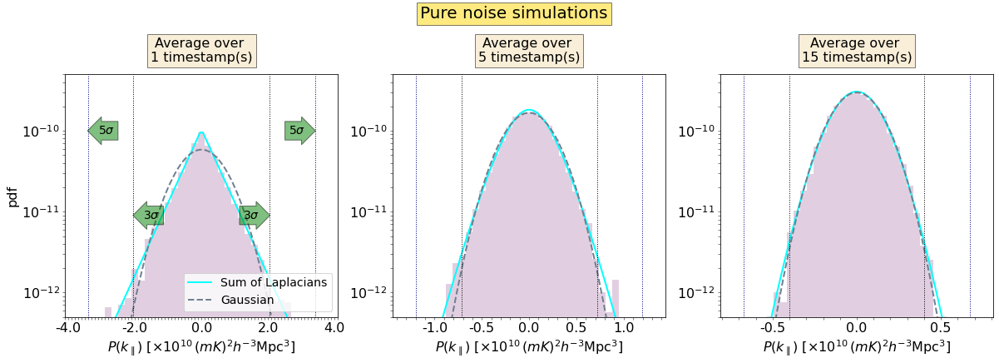

In [16]:
num_time_samples_list = [1,5,15]
fig, axes = plt.subplots(figsize=(20,6), ncols=3, nrows=1)
for ax_idx, num_time_samples in enumerate(num_time_samples_list):
    col_idx = ax_idx%3
    times = np.arange(num_time_samples)
   
    # Get all keys
    _key = uvp.get_all_keys()[0]

    blpt_weights = np.array([1. for item in times]).reshape(-1)
    Nspwdlys = len(uvps[0].get_dlys(0))
    ps_real_avg = []
    for dly in range(Nspwdlys):
        for uvp_plot in uvps:
            ps = np.array([uvp_plot.get_data(_key)[time, dly] for time in times]).reshape(-1)
            ps_real_avg.append(np.sum(ps.real*blpt_weights)/np.sum(blpt_weights).clip(1e-10, np.inf))

    # The ratio of error bars to the original one
    psunits = uvps[0].units
    if "h^-1" in psunits: psunits = psunits.replace("h^-1", "h^{-1}")
    if "h^-3" in psunits: psunits = psunits.replace("h^-3", "h^{-3}")
    if "Mpc" in psunits and "\\rm" not in psunits: 
        psunits = psunits.replace("Mpc", r"{\rm Mpc}")
    if "pi" in psunits and "\\pi" not in psunits: 
        psunits = psunits.replace("pi", r"\pi")
    nbins = 41
    ax = axes[col_idx]
    d = ps_real_avg - np.mean(ps_real_avg)
    vlim = 6*np.std(d)
    n_in_bins, bins_edge, _ = ax.hist(d, bins=nbins, log=True, density=True, range=(-vlim, vlim), color='thistle', alpha=0.75)
    ax.set_xlim(-vlim, vlim)
    ax.set_ylim(5*1e-13,5*1e-10)
    
    # Calculate the predicted pdf
    Lap_sigma_list = np.zeros(num_time_samples)
    for time in times:
        Lap_sigma_list[time] = np.sqrt(np.mean(np.abs(np.diag(uvps[0].get_cov(_key,component='real')[time])))) 
    px = np.linspace(-vlim, vlim, 100)
    Lap_curve = np.zeros_like(px)
    normalized_factor = 0
    for time in times:
        scale_factor = 1
        for time_ in times:
            if time_ != time:
                scale_factor *= Lap_sigma_list[time]**2/(Lap_sigma_list[time]**2-Lap_sigma_list[time_]**2)
        normalized_factor += scale_factor   
        Lap_curve += np.exp(-np.sqrt(2)*np.abs(px)/Lap_sigma_list[time]*num_time_samples)/np.sqrt(2)/Lap_sigma_list[time]*num_time_samples*scale_factor
    
    # Calculate the equivalent Gaussian pdf
    Gauss_sigma = np.sqrt(np.sum(Lap_sigma_list**2))/num_time_samples
    Gauss_curve = np.exp(-px**2/2/Gauss_sigma**2)/np.sqrt(2*np.pi*Gauss_sigma**2)
    if np.isclose(normalized_factor,1,rtol=5e-1):
        ax.plot(px, Lap_curve, ls='-', lw=2, label="Sum of Laplacians", c='cyan')
    ax.plot(px, Gauss_curve, ls='--', lw=2, label='Gaussian', c='slategrey')
    bins_center = (bins_edge[1:] + bins_edge[0:-1])/2
    outlier_3sigma = (np.sum(n_in_bins)-np.sum(n_in_bins[(-3*Gauss_sigma<=bins_center)*(bins_center<=3*Gauss_sigma)]))/np.sum(n_in_bins)
    print("beyond 3sigma {}".format(outlier_3sigma), \
          "Gauss {}".format((np.sum(Gauss_curve)-np.sum(Gauss_curve[(-3*Gauss_sigma<=px)*(px<=3*Gauss_sigma)]))/np.sum(Gauss_curve)), \
          "Laplacian {}".format((np.sum(Lap_curve)-np.sum(Lap_curve[(-3*Gauss_sigma<=px)*(px<=3*Gauss_sigma)]))/np.sum(Lap_curve)))

    # confidence interval
    ax.axvline(x=3*Gauss_sigma, c='k', lw=1, ls=':')
    ax.axvline(x=-3*Gauss_sigma, c='k', lw=1, ls=':')
    ax.axvline(x=5*Gauss_sigma, c='navy', lw=1, ls=':')
    ax.axvline(x=-5*Gauss_sigma, c='navy', lw=1, ls=':')
    if ax_idx == 0:
        ax.text(2.2*Gauss_sigma, 9*1e-12, r'$3 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="rarrow", fc="green", alpha=0.5))
        ax.text(4.2*Gauss_sigma, 1e-10, r'$5 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="rarrow", fc="green", alpha=0.5))
        ax.text(-2.2*Gauss_sigma, 9*1e-12, r'$3 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="larrow", fc="green", alpha=0.5))
        ax.text(-4.2*Gauss_sigma, 1e-10, r'$5 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="larrow", fc="green", alpha=0.5))
    
    ax.tick_params(which='both', labelsize=16, length=3, width=0.5)
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(1e9))
    xticks = ax.get_xticks()
    ax.set_xticklabels(xticks/1e10)
    ax.set_xlabel("$P(k_\parallel)$ $[\\times 10^{10}\,%s]$" % psunits, fontsize=16)
    if col_idx == 0: 
        ax.set_ylabel("pdf", fontsize=16)
    if ax_idx == 0:
        ax.legend(loc='lower right', fontsize=14)
    ax.set_title("Average over \n{} timestamp(s)".format(num_time_samples),bbox=dict(fc='wheat', alpha=0.5), fontsize=16, pad=15)
fig.subplots_adjust(top=0.8)
fig.suptitle("Pure noise simulations", fontsize=20, bbox=dict(fc='gold', alpha=0.5), x=0.5, y=0.99)    

In [17]:
len(uvps)*len(uvps[0].get_dlys(0))

9900

# Null tests on IDR2.2 data

In [4]:
# load power spectra
psc = hp.PSpecContainer('pspec_nulltest.h5', keep_open=False)
[uvp_cross] = psc.get_pspec('pI_shortbl')

In [5]:
delay_resolution = 1 / (uvp_cross.freq_array[-1]-uvp_cross.freq_array[0])*1e9

In [7]:
# load power spectra
psc = hp.PSpecContainer('pspec_nulltest.h5', keep_open=False)
[uvp_cross] = psc.get_pspec('pI_medbl')

#### on short baseline group

In [8]:
print(delay_resolution)

57.20670391061453


A larger window (2000), with normalization, consider normalization

beyond 3sigma 0.014220183486238507 Gauss 0.0024281159983349726 Laplacian 0.01357984543873155


/tmp/ipykernel_109871/3714915044.py:89: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks/1e10)


beyond 3sigma 0.006957186544342374 Gauss 0.0024281159983349687 Laplacian 0.005716982608200456


/tmp/ipykernel_109871/3714915044.py:89: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks/1e10)


beyond 3sigma 0.004051987767583898 Gauss 0.0024281159983350208 Laplacian -0.00010003268467600969
13080


/tmp/ipykernel_109871/3714915044.py:89: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks/1e10)


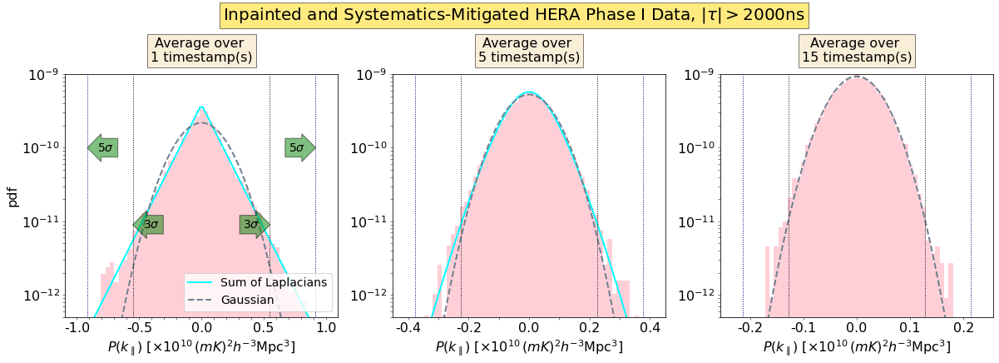

In [14]:
# used in paper
# A larger window (2000), with normalization
uvp_plot = uvp_cross
num_time_samples_list = [1,5,15]
ylim = (5*1e-13,1e-9)
dlys = uvp_plot.get_dlys(0) * 1e9
delay_args = np.append(np.argwhere(dlys< -2000), np.argwhere(dlys> 2000))
suptitle = "Inpainted and Systematics-Mitigated HERA Phase I Data, "+r"$|\tau|>2000 {\rm ns}$"

fig, axes = plt.subplots(figsize=(20,6), ncols=3, nrows=1)
for ax_idx, num_time_samples in enumerate(num_time_samples_list):
    col_idx = ax_idx%3
    times = np.arange(num_time_samples)
   
    # Get all keys
    keys = uvp_plot.get_all_keys()
    blpt_weights = np.array([[1. for item in times] for key in keys])
    ps_real_time_avg = []
    for dly in delay_args:
        ps = np.array([[uvp_plot.get_data(key)[time, dly]*uvp_plot.get_stats("autos_diag", keys[0])[time,0].real\
                        /uvp_plot.get_stats("autos_diag", key)[time, dly].real for time in times] for key in keys])
        ps_real_time_avg.extend((np.sum(ps.real*blpt_weights, axis=1)/np.sum(blpt_weights, axis=1).clip(1e-10, np.inf)).flatten())
    ps_real_time_avg = np.array(ps_real_time_avg) - np.mean(ps_real_time_avg)
    # The ratio of error bars to the original one
    psunits = uvp_plot.units
    if "h^-1" in psunits: psunits = psunits.replace("h^-1", "h^{-1}")
    if "h^-3" in psunits: psunits = psunits.replace("h^-3", "h^{-3}")
    if "Mpc" in psunits and "\\rm" not in psunits: 
        psunits = psunits.replace("Mpc", r"{\rm Mpc}")
    if "pi" in psunits and "\\pi" not in psunits: 
        psunits = psunits.replace("pi", r"\pi")
    
    ax = axes[col_idx]
    Lap_sigma_list = np.zeros(num_time_samples)
    for time in times:
        Lap_sigma_list[time] = uvp_plot.get_stats("autos_diag", keys[0])[time, 0].real 
    Gauss_sigma = np.sqrt(np.sum(Lap_sigma_list**2))/num_time_samples
    vlim = 6*Gauss_sigma
    n_in_bins, bins_edge, _ = ax.hist(ps_real_time_avg, log=True, density=True, bins=61, range=(-vlim, vlim), alpha=0.75,
                           color='pink')
    ax.set_xlim(-vlim, vlim)
    ax.set_ylim(*ylim)
    
    px = np.linspace(-vlim, vlim, 100)
    Lap_curve = np.zeros_like(px)
    normalized_factor = 0
    for time in times:
        scale_factor = 1
        for time_ in times:
            if time_ != time:
                scale_factor *= Lap_sigma_list[time]**2/(Lap_sigma_list[time]**2-Lap_sigma_list[time_]**2)
        normalized_factor += scale_factor   
        Lap_curve += np.exp(-np.sqrt(2)*np.abs(px)/Lap_sigma_list[time]*num_time_samples)/np.sqrt(2)/Lap_sigma_list[time]*num_time_samples*scale_factor
    
    # Calculate the equivalent Gaussian pdf
    Gauss_curve = np.exp(-px**2/2/Gauss_sigma**2)/np.sqrt(2*np.pi*Gauss_sigma**2)
    
    if np.isclose(normalized_factor,1,rtol=5e-1):
        ax.plot(px, Lap_curve, ls='-', lw=2, label="Sum of Laplacians", c='cyan')
    ax.plot(px, Gauss_curve, ls='--', lw=2, label='Gaussian', c='slategrey')
    bins_center = (bins_edge[1:] + bins_edge[0:-1])/2
    outlier_3sigma = (np.sum(n_in_bins)-np.sum(n_in_bins[(-3*Gauss_sigma<=bins_center)*(bins_center<=3*Gauss_sigma)]))/np.sum(n_in_bins)
    print("beyond 3sigma {}".format(outlier_3sigma), \
          "Gauss {}".format((np.sum(Gauss_curve)-np.sum(Gauss_curve[(-3*Gauss_sigma<=px)*(px<=3*Gauss_sigma)]))/np.sum(Gauss_curve)), \
          "Laplacian {}".format((np.sum(Lap_curve)-np.sum(Lap_curve[(-3*Gauss_sigma<=px)*(px<=3*Gauss_sigma)]))/np.sum(Lap_curve)))

    # confidence interval
    ax.axvline(x=3*Gauss_sigma, c='k', lw=1, ls=':')
    ax.axvline(x=-3*Gauss_sigma, c='k', lw=1, ls=':')
    ax.axvline(x=5*Gauss_sigma, c='navy', lw=1, ls=':')
    ax.axvline(x=-5*Gauss_sigma, c='navy', lw=1, ls=':')
    if ax_idx == 0:
        ax.text(2.2*Gauss_sigma, 9*1e-12, r'$3 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="rarrow", fc="green", alpha=0.5))
        ax.text(4.2*Gauss_sigma, 1e-10, r'$5 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="rarrow", fc="green", alpha=0.5))
        ax.text(-2.2*Gauss_sigma, 9*1e-12, r'$3 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="larrow", fc="green", alpha=0.5))
        ax.text(-4.2*Gauss_sigma, 1e-10, r'$5 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="larrow", fc="green", alpha=0.5))
    
    ax.tick_params(which='both', labelsize=16, length=3, width=0.5)
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(1e9))
    xticks = ax.get_xticks()
    ax.set_xticklabels(xticks/1e10)
    ax.set_xlabel("$P(k_\parallel)$ $[\\times 10^{10}\,%s]$" % psunits, fontsize=16)
    if col_idx == 0: 
        ax.set_ylabel("pdf", fontsize=16)
    if ax_idx == 0:
        ax.legend(loc='lower right', fontsize=14)
    ax.set_title("Average over \n{} timestamp(s)".format(num_time_samples),bbox=dict(fc='wheat', alpha=0.5), fontsize=16, pad=15)
fig.subplots_adjust(top=0.8)
fig.suptitle(suptitle, fontsize=20, bbox=dict(fc='gold', alpha=0.5), x=0.5, y=0.99)
print(len(uvp_plot.get_all_keys())*len(delay_args))

beyond 3sigma 0.0220162224797221 Gauss 0.0024281159983349726 Laplacian 0.01357984543873155


/tmp/ipykernel_109871/3472246326.py:89: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks/1e10)


beyond 3sigma 0.008796296296296233 Gauss 0.0024281159983349687 Laplacian 0.005716982608200456


/tmp/ipykernel_109871/3472246326.py:89: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks/1e10)


beyond 3sigma 0.01018518518518503 Gauss 0.0024281159983350208 Laplacian -0.00010003268467600969
4320


/tmp/ipykernel_109871/3472246326.py:89: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks/1e10)


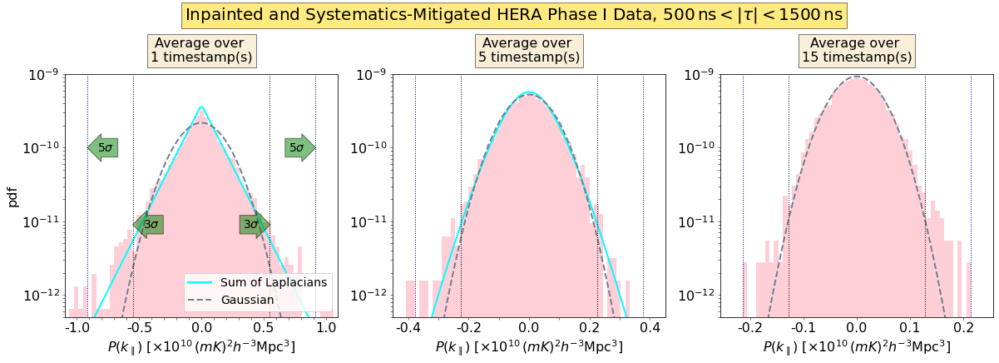

In [15]:
# used in paper
# A larger window (500-1500), with normalization
uvp_plot = uvp_cross
num_time_samples_list = [1,5,15]
ylim = (5*1e-13,1e-9)
dlys = uvp_plot.get_dlys(0) * 1e9
delay_args = np.append(np.argwhere((dlys< -500)*(dlys>-1500)), np.argwhere((dlys< 1500)*(dlys>500)))
suptitle = "Inpainted and Systematics-Mitigated HERA Phase I Data, "+r"$500\,{\rm ns}<|\tau|<1500\,{\rm ns}$"

fig, axes = plt.subplots(figsize=(20,6), ncols=3, nrows=1)
for ax_idx, num_time_samples in enumerate(num_time_samples_list):
    col_idx = ax_idx%3
    times = np.arange(num_time_samples)
   
    # Get all keys
    keys = uvp_plot.get_all_keys()
    blpt_weights = np.array([[1. for item in times] for key in keys])
    ps_real_time_avg = []
    for dly in delay_args:
        ps = np.array([[uvp_plot.get_data(key)[time, dly]*uvp_plot.get_stats("autos_diag", keys[0])[time,0].real\
                        /uvp_plot.get_stats("autos_diag", key)[time, dly].real for time in times] for key in keys])
        ps_real_time_avg.extend((np.sum(ps.real*blpt_weights, axis=1)/np.sum(blpt_weights, axis=1).clip(1e-10, np.inf)).flatten())
    ps_real_time_avg = np.array(ps_real_time_avg) - np.mean(ps_real_time_avg)
    # The ratio of error bars to the original one
    psunits = uvp_plot.units
    if "h^-1" in psunits: psunits = psunits.replace("h^-1", "h^{-1}")
    if "h^-3" in psunits: psunits = psunits.replace("h^-3", "h^{-3}")
    if "Mpc" in psunits and "\\rm" not in psunits: 
        psunits = psunits.replace("Mpc", r"{\rm Mpc}")
    if "pi" in psunits and "\\pi" not in psunits: 
        psunits = psunits.replace("pi", r"\pi")
    
    ax = axes[col_idx]
    Lap_sigma_list = np.zeros(num_time_samples)
    for time in times:
        Lap_sigma_list[time] = uvp_plot.get_stats("autos_diag", keys[0])[time, 0].real 
    Gauss_sigma = np.sqrt(np.sum(Lap_sigma_list**2))/num_time_samples
    vlim = 6*Gauss_sigma
    n_in_bins, bins_edge, _ = ax.hist(ps_real_time_avg, log=True, density=True, bins=61, range=(-vlim, vlim), alpha=0.75,
                           color='pink')
    ax.set_xlim(-vlim, vlim)
    ax.set_ylim(*ylim)
    
    px = np.linspace(-vlim, vlim, 100)
    Lap_curve = np.zeros_like(px)
    normalized_factor = 0
    for time in times:
        scale_factor = 1
        for time_ in times:
            if time_ != time:
                scale_factor *= Lap_sigma_list[time]**2/(Lap_sigma_list[time]**2-Lap_sigma_list[time_]**2)
        normalized_factor += scale_factor   
        Lap_curve += np.exp(-np.sqrt(2)*np.abs(px)/Lap_sigma_list[time]*num_time_samples)/np.sqrt(2)/Lap_sigma_list[time]*num_time_samples*scale_factor
    
    # Calculate the equivalent Gaussian pdf
    Gauss_curve = np.exp(-px**2/2/Gauss_sigma**2)/np.sqrt(2*np.pi*Gauss_sigma**2)
    
    if np.isclose(normalized_factor,1,rtol=5e-1):
        ax.plot(px, Lap_curve, ls='-', lw=2, label="Sum of Laplacians", c='cyan')
    ax.plot(px, Gauss_curve, ls='--', lw=2, label='Gaussian', c='slategrey')
    bins_center = (bins_edge[1:] + bins_edge[0:-1])/2
    outlier_3sigma = (np.sum(n_in_bins)-np.sum(n_in_bins[(-3*Gauss_sigma<=bins_center)*(bins_center<=3*Gauss_sigma)]))/np.sum(n_in_bins)
    print("beyond 3sigma {}".format(outlier_3sigma), \
          "Gauss {}".format((np.sum(Gauss_curve)-np.sum(Gauss_curve[(-3*Gauss_sigma<=px)*(px<=3*Gauss_sigma)]))/np.sum(Gauss_curve)), \
          "Laplacian {}".format((np.sum(Lap_curve)-np.sum(Lap_curve[(-3*Gauss_sigma<=px)*(px<=3*Gauss_sigma)]))/np.sum(Lap_curve)))

    # confidence interval
    ax.axvline(x=3*Gauss_sigma, c='k', lw=1, ls=':')
    ax.axvline(x=-3*Gauss_sigma, c='k', lw=1, ls=':')
    ax.axvline(x=5*Gauss_sigma, c='navy', lw=1, ls=':')
    ax.axvline(x=-5*Gauss_sigma, c='navy', lw=1, ls=':')
    if ax_idx == 0:
        ax.text(2.2*Gauss_sigma, 9*1e-12, r'$3 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="rarrow", fc="green", alpha=0.5))
        ax.text(4.2*Gauss_sigma, 1e-10, r'$5 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="rarrow", fc="green", alpha=0.5))
        ax.text(-2.2*Gauss_sigma, 9*1e-12, r'$3 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="larrow", fc="green", alpha=0.5))
        ax.text(-4.2*Gauss_sigma, 1e-10, r'$5 \sigma$', ha="center", va="center", rotation=0,
            fontsize=14,
            bbox=dict(boxstyle="larrow", fc="green", alpha=0.5))
    
    ax.tick_params(which='both', labelsize=16, length=3, width=0.5)
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(1e9))
    xticks = ax.get_xticks()
    ax.set_xticklabels(xticks/1e10)
    ax.set_xlabel("$P(k_\parallel)$ $[\\times 10^{10}\,%s]$" % psunits, fontsize=16)
    if col_idx == 0: 
        ax.set_ylabel("pdf", fontsize=16)
    if ax_idx == 0:
        ax.legend(loc='lower right', fontsize=14)
    ax.set_title("Average over \n{} timestamp(s)".format(num_time_samples),bbox=dict(fc='wheat', alpha=0.5), fontsize=16, pad=15)
fig.subplots_adjust(top=0.8)
fig.suptitle(suptitle, fontsize=20, bbox=dict(fc='gold', alpha=0.5), x=0.5, y=0.99)
print(len(uvp_plot.get_all_keys())*len(delay_args))

consider fit the Gaussian curve

In [16]:
from scipy.optimize import curve_fit
def gaussian(x, cen, wid):
    return np.exp(-(x-cen)**2 / 2/wid**2)/np.sqrt(2*np.pi*wid**2)
init_vals = [0, 1]  # for [cen, wid]

In [ ]:
# A larger window (2000), with different Gaussian sigma, substract the mean
uvp_plot = uvp_cross
num_time_samples_list = [5,10,15,20]
fig, axes = plt.subplots(figsize=(15,13), ncols=2, nrows=2)

for ax_idx, num_time_samples in enumerate(num_time_samples_list):
    col_idx = ax_idx%2
    row_idx = int((ax_idx - col_idx)/2)
    times = np.arange(num_time_samples)
   
    # Get all keys
    keys = uvp_plot.get_all_keys()
    blpt_weights = np.array([[1. for item in times] for key in keys])
    dlys = uvp_plot.get_dlys(0) * 1e9
    delay_args = np.append(np.argwhere(dlys< -2000), np.argwhere(dlys> 2000))
    ps_real_time_avg = []
    for dly in delay_args:
        ps = np.array([[uvp_plot.get_data(key)[time, dly] for time in times] for key in keys])
        ps_real_time_avg.extend((np.sum(ps.real*blpt_weights, axis=1)/np.sum(blpt_weights, axis=1).clip(1e-10, np.inf)).flatten())
    ps_real_time_avg = np.array(ps_real_time_avg) - np.mean(ps_real_time_avg)
    # The ratio of error bars to the original one
    psunits = uvp_plot.units
    if "h^-1" in psunits: psunits = psunits.replace("h^-1", "h^{-1}")
    if "h^-3" in psunits: psunits = psunits.replace("h^-3", "h^{-3}")
    if "Mpc" in psunits and "\\rm" not in psunits: 
        psunits = psunits.replace("Mpc", r"{\rm Mpc}")
    if "pi" in psunits and "\\pi" not in psunits: 
        psunits = psunits.replace("pi", r"\pi")
    
    ax = axes[row_idx, col_idx]
    Lap_sigma_list = np.zeros(num_time_samples)
    for time in times:
        Lap_sigma_list[time] = np.sqrt(np.mean(np.square([uvp_plot.get_stats("autos_diag", key)[time].real for key in keys])))
    Gauss_sigma = np.sqrt(np.sum(Lap_sigma_list**2))/num_time_samples
    vlim = 6*Gauss_sigma
    n_in_bins, bins_edge, _ = ax.hist(ps_real_time_avg, log=True, density=True, bins=61, range=(-vlim, vlim), alpha=0.75,
                           color='pink')
    ax.set_xlim(-vlim, vlim)
    ax.set_ylim(0,1.2*n_in_bins.max())
    px = np.linspace(-vlim, vlim, 100)
    custom_cycler = (cycler.cycler(color=['c', 'm', 'y', 'k']) +
                 cycler.cycler(ls=["-.", "--", "-", ":"]))
    ax.set_prop_cycle(custom_cycler)
    for factor in [1,1.1,1.2]:
    # Calculate the equivalent Gaussian pdf
        Gauss_curve = np.exp(-px**2/2/(factor*Gauss_sigma)**2)/np.sqrt(2*np.pi*(factor*Gauss_sigma)**2)
        ax.plot(px, Gauss_curve, label=str(factor))
    
    bins_center = (bins_edge[1:] + bins_edge[:-1])/2
    best_vals, covar = curve_fit(gaussian, bins_center, n_in_bins, p0=init_vals)
    ax.plot(px, gaussian(px, *best_vals), label='fitting')
    
    ax.tick_params(which='both', labelsize=16, length=3, width=0.5)
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(1e9))
    xticks = ax.get_xticks()
    ax.set_xticklabels(xticks/1e10)
    if row_idx == 1:
        ax.set_xlabel("$P(k_\parallel)$ $[\\times 10^{10}\,%s]$" % psunits, fontsize=20)
    if col_idx == 0: 
        ax.set_ylabel("PDF", fontsize=20)
    if ax_idx == 0:
        ax.legend(loc='lower right', fontsize=14)
    ax.text(0.05, 0.5, "Average spectra over \n{} timestamp(s)".format(num_time_samples), transform=ax.transAxes, bbox=dict(facecolor='red', alpha=0.5), fontsize=16, color='k')

/tmp/ipykernel_109871/3161205868.py:39: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set_ylim(0,1.2*n_in_bins.max())
/tmp/ipykernel_109871/3161205868.py:56: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks/1e10)
/tmp/ipykernel_109871/3161205868.py:39: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set_ylim(0,1.2*n_in_bins.max())
/tmp/ipykernel_109871/3161205868.py:56: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks/1e10)
/tmp/ipykernel_109871/3161205868.py:39: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set_ylim(0,1.2*n_in_bins.max())
/tmp/ipykernel_109871/3161205868.py:56: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks/1e10

#### on medium baseline group